# Template Matching

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
reference = cv2.imread('/content/where_is_waldo.jpg')

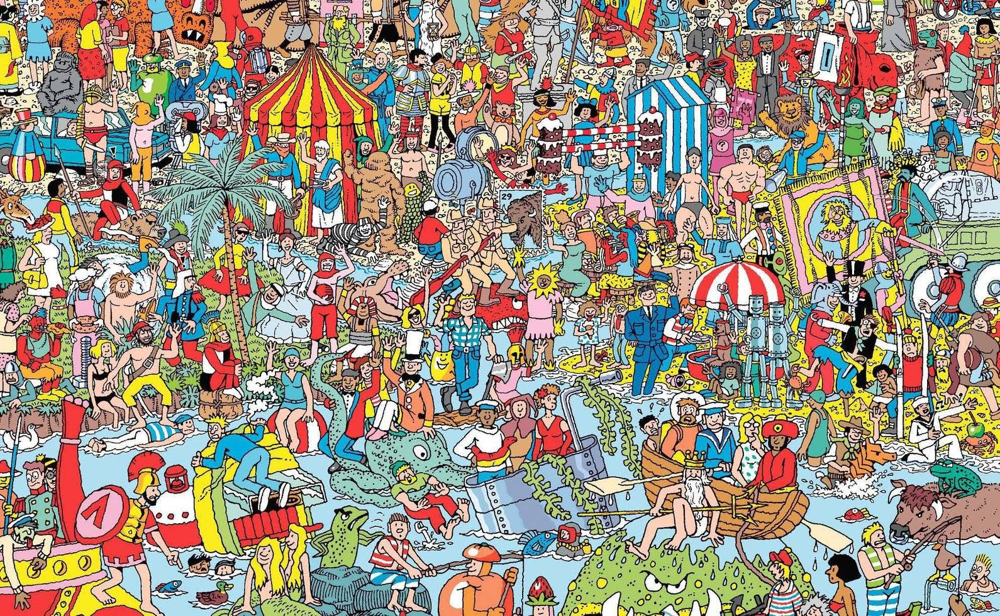

-1

In [ ]:
cv2_imshow(reference)
cv2.waitKey(0)

In [ ]:
ref_img = cv2.cvtColor(reference, cv2.COLOR_RGB2GRAY)

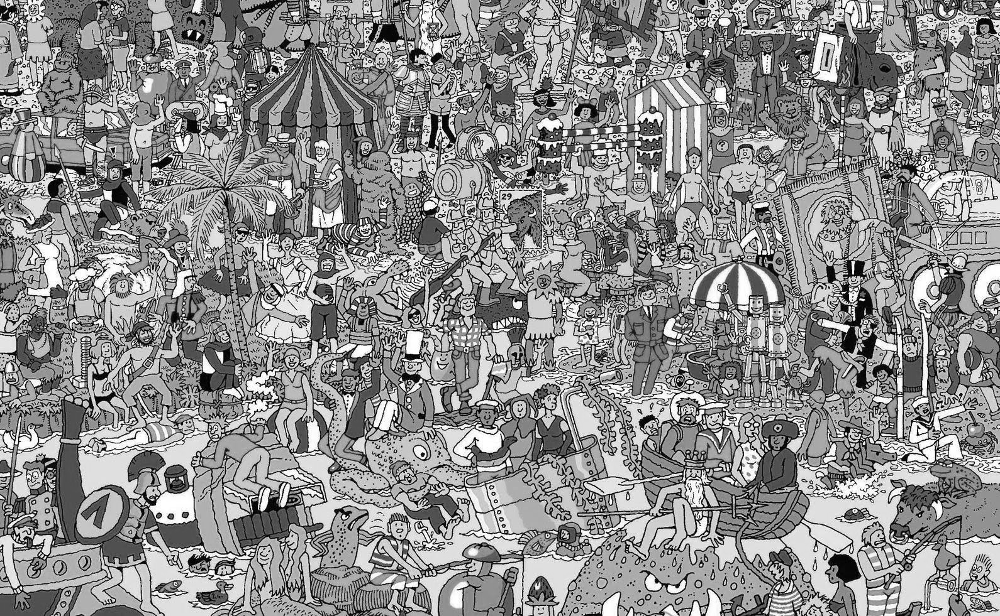

-1

In [ ]:
cv2_imshow(ref_img)
cv2.waitKey(0)

In [ ]:
cv2.imwrite("graypic.jpg", ref_img)

True

In [ ]:
to_find = cv2.imread("/content/template1.png")
print(to_find)


[[[ 61  50 237]
  [ 63  52 232]
  [ 62  56 221]
  ...
  [ 56  51 236]
  [ 69  65 254]
  [ 58  51 242]]

 [[ 71  61 237]
  [ 76  69 234]
  [ 67  64 217]
  ...
  [ 71  64 253]
  [ 61  55 244]
  [ 67  62 247]]

 [[ 75  71 230]
  [ 64  62 211]
  [ 71  68 208]
  ...
  [ 57  52 237]
  [ 64  62 245]
  [ 55  55 227]]

 ...

 [[ 66  62 245]
  [ 67  65 249]
  [ 52  49 225]
  ...
  [ 26  28  63]
  [ 89  92 123]
  [121 122 148]]

 [[ 57  54 234]
  [ 57  53 236]
  [ 63  61 235]
  ...
  [ 16  18  59]
  [112 113 151]
  [116 118 149]]

 [[ 64  61 241]
  [ 55  52 232]
  [ 59  57 230]
  ...
  [ 39  39  87]
  [143 142 184]
  [133 133 169]]]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
to_find = cv2.cvtColor(to_find, cv2.COLOR_RGB2GRAY)

In [ ]:
height, width =ref_img.shape
height, width

(981, 1590)

In [ ]:
h, w =to_find.shape
h, w

(37, 31)

In [ ]:
methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR,
             cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]

| Method                    | Use Case                                                   |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_CCOEFF`           | - Good for detecting patterns with strong positive correlation.                                                |
|                           | - Suitable when you want to find regions that closely resemble the template.                                 |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_CCOEFF_NORMED`    | - Similar to `cv2.TM_CCOEFF` but with normalized scores between -1 and 1.                                      |
|                           | - Useful for comparing templates of different sizes and orientations.                                          |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_CCORR`            | - Effective for detecting patterns with high cross-correlation.                                                 |
|                           | - Appropriate when the template should match closely with the reference image.                                  |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_CCORR_NORMED`     | - Similar to `cv2.TM_CCORR` but with normalized scores between 0 and 1.                                        |
|                           | - Useful for comparing templates of different sizes and orientations.                                          |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_SQDIFF`           | - Suitable for detecting patterns with low squared differences.                                                 |
|                           | - Effective when you want to find regions that closely match the template.                                       |
|---------------------------|------------------------------------------------------------|
| `cv2.TM_SQDIFF_NORMED`    | - Similar to `cv2.TM_SQDIFF` but with normalized scores between 0 and 1.                                        |
|                           | - Useful for comparing templates of different sizes and orientations.                                          |
|---------------------------|------------------------------------------------------------|


(306, 580) (1258, 74)


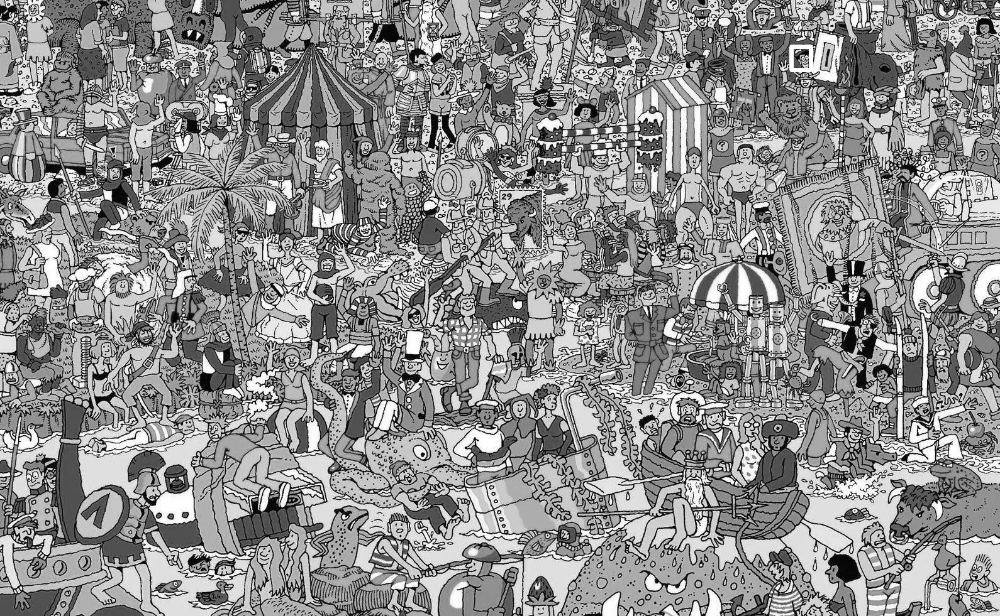

(306, 580) (1258, 74)


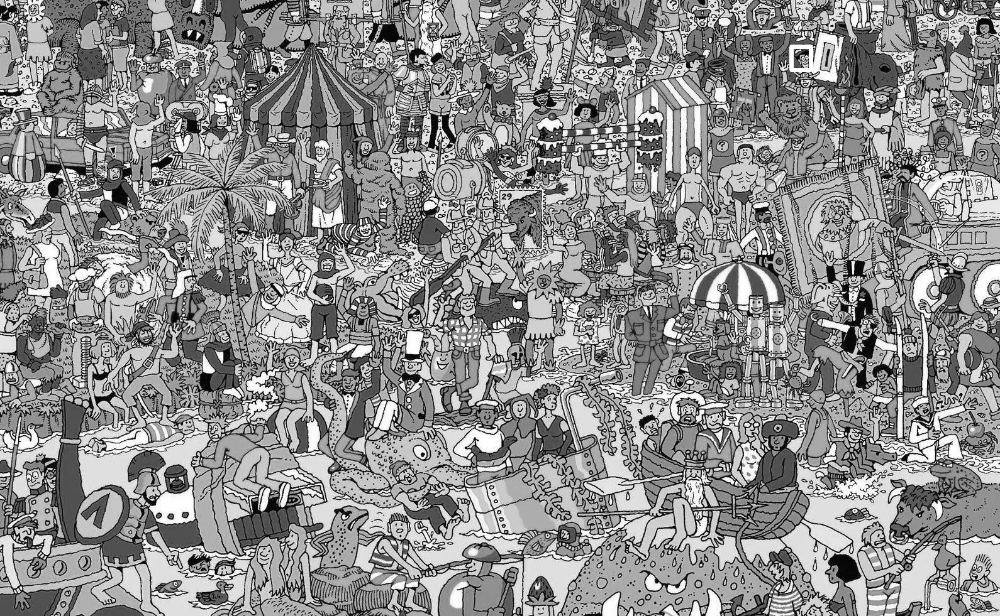

(1331, 887) (259, 786)


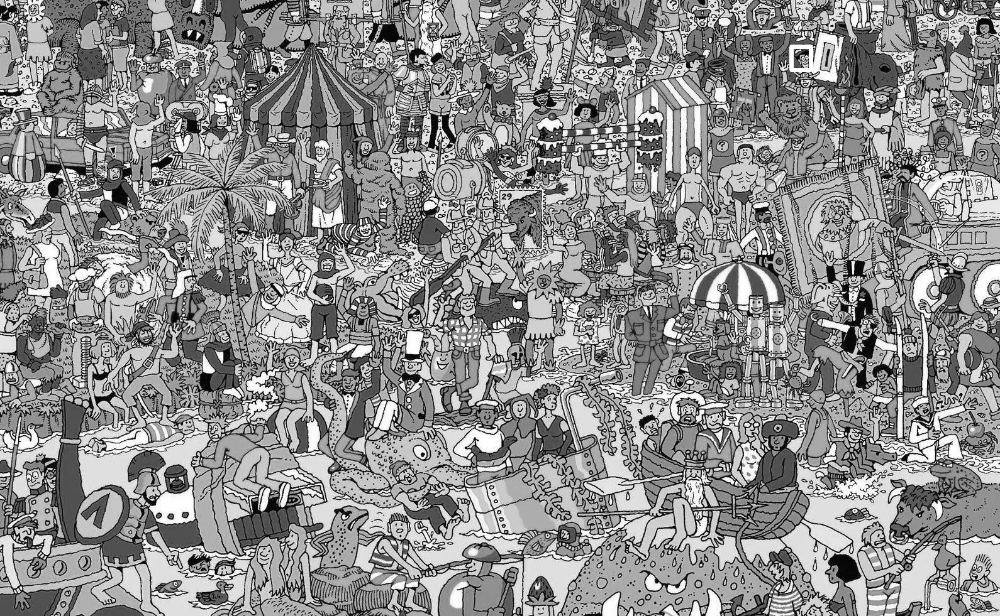

(1333, 884) (1258, 74)


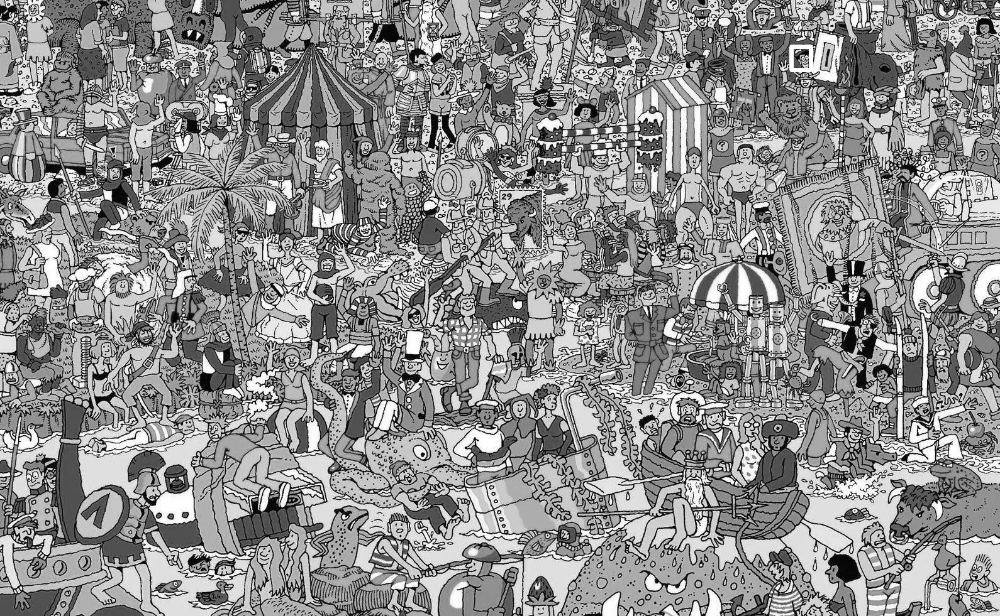

(1258, 74) (276, 790)


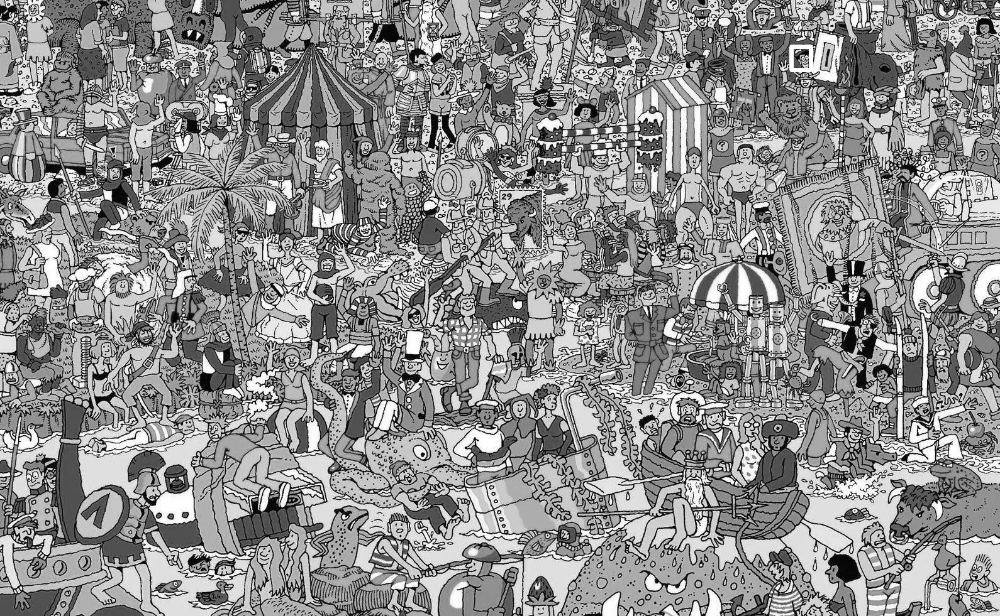

(1258, 74) (599, 20)


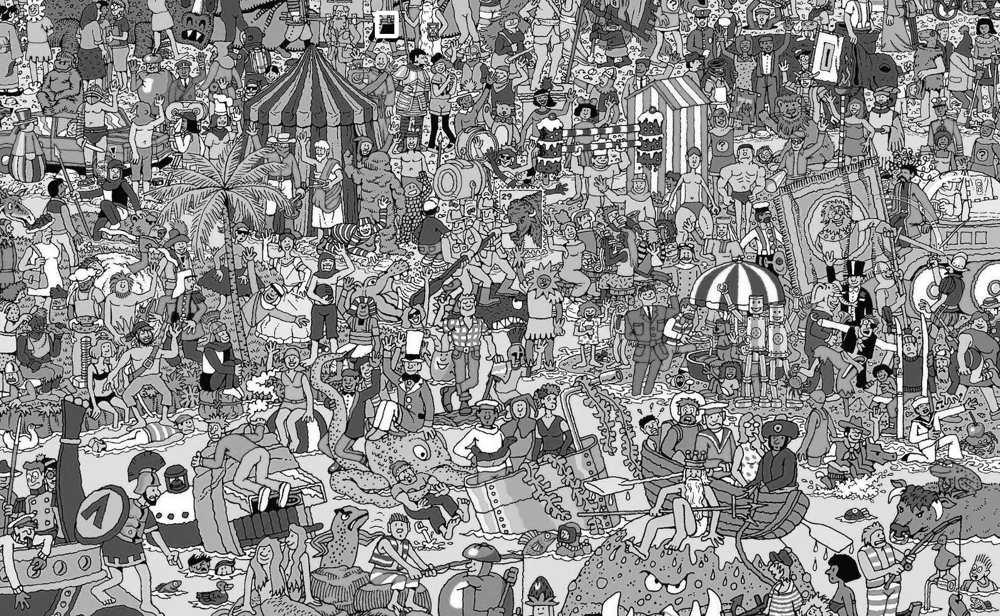

In [ ]:
for method in methods:
   ref_img2 = ref_img.copy()
   result = cv2.matchTemplate(ref_img2, to_find, method)
   min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
   print(min_loc, max_loc)
   if method in [cv2.TM_SQDIFF,cv2.TM_CCORR]:
     lacation = min_loc
   else:
     location = max_loc
   bottom_right = (location[0] + w, location[1] + h)
   cv2.rectangle(ref_img2, location,bottom_right, 255,5)
   cv2_imshow(ref_img2)
   cv2.waitKey(0)
   cv2.destroyAllWindows()

The last method, cv2.TM_SQDIFF_NORMED (Normalized Squared Difference Method), performs poorly because it is designed to work differently from the other methods, and its match scores are interpreted in the opposite way compared to the other methods.

In [ ]:
ref_height, ref_width = ref_img.shape

In [ ]:
temp_height, temp_width = to_find.shape

In [ ]:
import numpy as np


In [ ]:
output_image = np.zeros((ref_height - temp_height + 1, ref_width - temp_width + 1), dtype=np.float32)

In [ ]:
for y in range(ref_height - temp_height + 1):
    for x in range(ref_width - temp_width + 1):
        patch = ref_img[y:y+temp_height, x:x+temp_width]

In [ ]:
ssd = np.sum((patch.astype(np.float32) - to_find.astype(np.float32))**2)


In [ ]:
output_image[y, x] = ssd

In [ ]:
min_loc = np.unravel_index(output_image.argmin(), output_image.shape)

In [ ]:
min_loc = np.unravel_index(output_image.argmin(), output_image.shape)

In [ ]:
top_left = min_loc
bottom_right = (top_left[0] + temp_width, top_left[1] + temp_height)
cv2.rectangle(ref_img, top_left, bottom_right, 255, 2)

array([[255, 255, 255, ...,  13,   6,  85],
       [255, 255, 255, ...,  28,   4,  73],
       [255, 255, 193, ...,  76,   9,  10],
       ...,
       [ 80,  80,  80, ..., 223, 223, 223],
       [ 80,  80,  80, ..., 223, 223, 223],
       [ 80,  80,  80, ..., 223, 223, 223]], dtype=uint8)

In [ ]:
cv2.imshow('Reference Image', ref_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

DisabledFunctionError: ignored

# Image Transformations

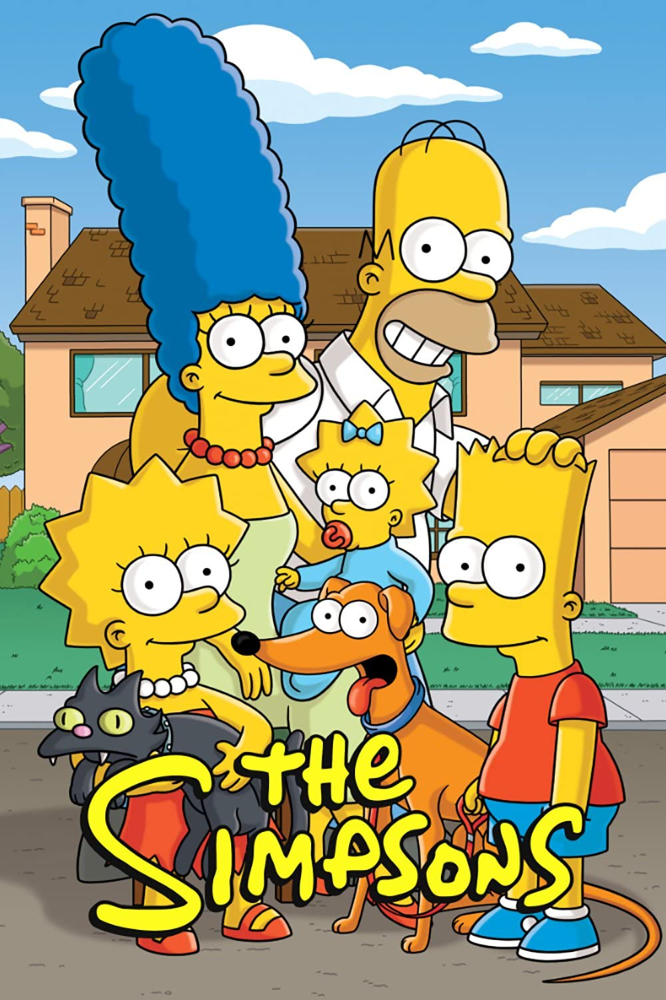

In [ ]:
bus = cv2.imread('/content/bus.jpeg')
simpsons = cv2.imread("/content/simpsons.jpeg")
cv2_imshow(simpsons)